# BRAID v2 — MLP: visual-ROI betas -> CLIP image embeddings

Same MLP as `legacy/braidv1.py`, but the regression target is the 1280-dim CLIP
image embedding (`clip_embeds_subj01/`) instead of the 16384-dim SDXL latent.

Assumes betas and CLIP embeds live in Drive under `nsd_bundle/`, one file per session:
- `visualroi_betas/subj01_visualroi_session{NN}.pt`  -> `[750, D]` (masked)
- `clip_embeds_subj01/subj01_clip_embeds{NN}.pt`      -> `[750, 1280]`

In [ ]:
import os, glob
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r /content/drive/MyDrive/braid2/nsd_bundle/visualroi_betas .

In [ ]:
!cp -r /content/drive/MyDrive/braid2/nsd_bundle/clip_embeds_subj01 .

In [ ]:
!cp -r /content/drive/MyDrive/braid2/nsd_stimuli.hdf5 .

In [ ]:
# --- config ---
BASE      = "/content/"
BETA_DIR  = f"{BASE}/visualroi_betas"
CLIP_DIR  = f"{BASE}/clip_embeds_subj01"
SUBJECT   = "subj01"
EPOCHS    = 15
BATCH     = 512
LR        = 1e-4
DEVICE    = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", DEVICE)

device: cuda


In [ ]:
# --- run setup: which losses to sweep, and where to save each run ---
LOSS_TYPES = ["mse", "cosine"]

import time
RUNS_DIR  = "/content/drive/MyDrive/braid2/runs"
SWEEP_TAG = time.strftime('%Y%m%d_%H%M%S')     # groups this sweep's runs together under one timestamp

## Load + pair data (shared-1000 protocol)
Auto-discover paired sessions, then split at the **image** level (not trial level) to avoid
repeat leakage: the **shared-1000** images (`sharedix` in `nsd_expdesign.mat`) are the test set,
5% of the remaining images are validation, the rest are train. Normalization stats come from
**train only**, and the test set **averages each image's 3 repeats** into one denoised sample.

In [ ]:
import numpy as np, urllib.request
from collections import defaultdict
from scipy.io import loadmat

def session_id(path):
    return int(''.join(c for c in os.path.basename(path)[-6:] if c.isdigit()))

beta_sess = {session_id(p): p for p in glob.glob(f"{BETA_DIR}/{SUBJECT}_visualroi_session*.pt")}
clip_sess = {session_id(p): p for p in glob.glob(f"{CLIP_DIR}/{SUBJECT}_clip_embeds*.pt")}
sessions  = sorted(set(beta_sess) & set(clip_sess))
print(f"{len(sessions)} paired sessions:", sessions)

betas = torch.cat([torch.load(beta_sess[s]).float() for s in sessions])   # [N, D]
clips = torch.cat([torch.load(clip_sess[s]).float() for s in sessions])   # [N, 1280]
print("betas:", tuple(betas.shape), "| clips:", tuple(clips.shape))

# --- NSD design: trial -> imgBrick image id, and the shared-1000 test images ---
EXP = f"{BASE}/nsd_expdesign.mat"
if not os.path.exists(EXP):
    urllib.request.urlretrieve(
        "https://natural-scenes-dataset.s3.amazonaws.com/nsddata/experiments/nsd/nsd_expdesign.mat", EXP)
mat            = loadmat(EXP)
masterordering = mat["masterordering"].reshape(-1).astype(np.int64) - 1    # [30000] subject-image idx
subjectim      = mat["subjectim"].astype(np.int64) - 1                     # [8,10000] -> imgBrick idx
imgbrick_ids   = subjectim[int(SUBJECT[-2:]) - 1, masterordering]          # [30000] imgBrick idx per trial
shared_ids     = set(mat["sharedix"].reshape(-1).astype(np.int64) - 1)     # 1000 shared imgBrick ids

def img_id(g):                                     # concat-trial idx -> imgBrick image id
    sess, trial = sessions[g // 750], g % 750
    return int(imgbrick_ids[(sess - 1) * 750 + trial])

img_of = np.array([img_id(g) for g in range(len(betas))])                  # image id per trial

# --- image-level split: shared-1000 -> test ; 5% of remaining images -> val ; rest -> train ---
is_test  = np.array([i in shared_ids for i in img_of])
rest_img = np.array(sorted(set(img_of[~is_test])))
np.random.RandomState(0).shuffle(rest_img)
val_img   = set(rest_img[:int(0.05 * len(rest_img))])
in_val    = np.array([i in val_img for i in img_of])
train_idx = np.where(~is_test & ~in_val)[0]
val_idx   = np.where(~is_test &  in_val)[0]
test_idx  = np.where(is_test)[0]
print(f"train {len(train_idx)} | val {len(val_idx)} | test trials {len(test_idx)} "
      f"| unique test images {len(set(img_of[test_idx]))}")

# --- normalization stats from TRAIN trials only (no leak into val/test) ---
beta_mean, beta_std = betas[train_idx].mean(0), betas[train_idx].std(0) + 1e-6
clip_mean, clip_std = clips[train_idx].mean(0), clips[train_idx].std(0) + 1e-6
torch.save({'mean': beta_mean, 'std': beta_std}, f"{BASE}/beta_norm_stats.pt")
torch.save({'mean': clip_mean, 'std': clip_std}, f"{BASE}/clip_norm_stats.pt")
def norm(b, c): return (b - beta_mean) / beta_std, (c - clip_mean) / clip_std

# --- train / val use all repeats (safe: shared images are fully held out) ---
train_ds = TensorDataset(*norm(betas[train_idx], clips[train_idx]))
val_ds   = TensorDataset(*norm(betas[val_idx],   clips[val_idx]))

# --- test: average each shared image's 3 repeats -> one denoised sample per image ---
groups = defaultdict(list)
for g in test_idx: groups[int(img_of[g])].append(g)
test_img_ids = list(groups.keys())
test_betas   = torch.stack([betas[gs].mean(0) for gs in groups.values()])  # raw, repeat-averaged
test_clips   = torch.stack([clips[gs[0]]       for gs in groups.values()])  # identical target per image
test_ds      = TensorDataset(*norm(test_betas, test_clips))

train_loader = DataLoader(train_ds, batch_size=BATCH, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH)
test_loader  = DataLoader(test_ds,  batch_size=BATCH)

40 paired sessions: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
betas: (30000, 4657) | clips: (30000, 1280)
train 25650 | val 1350 | test trials 3000 | unique test images 1000


In [ ]:
# import os
# for s in sessions:
#     p = clip_sess[s]
#     size = os.path.getsize(p)
#     try:
#         torch.load(p)
#         status = "ok"
#     except Exception as e:
#         status = f"FAILED: {type(e).__name__}: {e}"
#     print(f"session {s}: {os.path.basename(p)}  ({size:,} bytes)  -> {status}")


## Model — same MLP as braidv1 (output_dim = 1280)

In [ ]:
def make_loss_fn(kind):
    if kind == "mse":
        return nn.MSELoss()
    if kind == "cosine":
        return lambda pred, y: 1 - F.cosine_similarity(pred, y, dim=1).mean()
    raise ValueError(f"unknown LOSS_TYPE: {kind!r}")


class FMRIEncoderMLP(nn.Module):
    def __init__(self, input_dim, output_dim=1280, dropout=0.5):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 2048),
            nn.LayerNorm(2048), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(2048, 4096),
            nn.LayerNorm(4096), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(4096, output_dim),
        )

    def forward(self, x):
        return self.net(x)

## Train

In [ ]:
def train_one(loss_type):
    run_dir = f"{RUNS_DIR}/mlp_{loss_type}_{SWEEP_TAG}"
    os.makedirs(run_dir, exist_ok=True)

    model     = FMRIEncoderMLP(input_dim=betas.shape[1], output_dim=clips.shape[1]).to(DEVICE)
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    loss_fn   = make_loss_fn(loss_type)

    @torch.no_grad()
    def evaluate(loader):
        model.eval()
        total, count = 0.0, 0
        for x, y in loader:
            x, y = x.to(DEVICE), y.to(DEVICE)
            total += loss_fn(model(x), y).item() * x.size(0)
            count += x.size(0)
        return total / count

    train_losses, val_losses = [], []
    for epoch in range(1, EPOCHS + 1):
        model.train()
        running = 0.0
        for x, y in tqdm(train_loader, desc=f"[{loss_type}] Epoch {epoch}/{EPOCHS}", leave=False):
            x, y = x.to(DEVICE), y.to(DEVICE)
            pred = model(x)
            loss = loss_fn(pred, y)
            optimizer.zero_grad(); loss.backward(); optimizer.step()
            running += loss.item() * x.size(0)

        train_losses.append(running / len(train_ds))
        val_losses.append(evaluate(val_loader))
        print(f"[{loss_type}] Epoch {epoch:3d} - Train: {train_losses[-1]:.4f} | Val: {val_losses[-1]:.4f}")

    torch.save(model.state_dict(), f"{run_dir}/model.pth")
    print(f"[{loss_type}] saved: {run_dir}/model.pth")

    plt.figure(dpi=300)
    plt.plot(train_losses, label=f"Train {loss_type}")
    plt.plot(val_losses,   label=f"Val {loss_type}")
    plt.xlabel("Epoch"); plt.ylabel(f"{loss_type} loss"); plt.legend(); plt.grid(alpha=0.3)
    plt.title(f"loss = {loss_type}")
    plt.savefig(f"{run_dir}/loss_curve.png", dpi=300, bbox_inches="tight")
    plt.show()

    return model, run_dir

## Diagnostics — fMRI vs CLIP manifolds + variance vs #components
Per loss: dimensionality-reduction plot (PCA/t-SNE/UMAP, predicted vs true CLIP embeddings) and the
PCA-alignment scree plot (does the predicted cloud track the true cloud's effective dimensionality,
or collapse into fewer components). Also returns test cosine similarity, used afterward to pick which
loss's model goes on to the (expensive) decode step.

In [ ]:
!pip install -q umap-learn
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

In [ ]:
def diagnose(model, run_dir, loss_type):
    @torch.no_grad()
    def collect(loader):
        model.eval()
        cm, cs = clip_mean.to(DEVICE), clip_std.to(DEVICE)
        P, T = [], []
        for x, y in loader:
            P.append((model(x.to(DEVICE)) * cs + cm).cpu())     # predicted, raw CLIP space
            T.append((y.to(DEVICE) * cs + cm).cpu())            # true, raw CLIP space
        return torch.cat(P).numpy(), torch.cat(T).numpy()

    pred, true = collect(test_loader)
    cos_sim = float(F.cosine_similarity(torch.from_numpy(pred), torch.from_numpy(true), dim=1).mean())
    print(f"[{loss_type}] pred: {pred.shape} | true: {true.shape} | test cosine similarity: {cos_sim:.4f}")

    def radius(a):                                              # avg distance of points to their own centroid
        return np.linalg.norm(a - a.mean(0), axis=1).mean()
    print(f"[{loss_type}] mean L2 norm    ->  fMRI-pred: {np.linalg.norm(pred, axis=1).mean():.2f}"
          f"   CLIP image: {np.linalg.norm(true, axis=1).mean():.2f}")
    print(f"[{loss_type}] cluster radius  ->  fMRI-pred: {radius(pred):.2f}"
          f"   CLIP image: {radius(true):.2f}   (smaller = more collapsed)")

    emb    = np.concatenate([pred, true])                       # [2N, 1280]
    colors = ['green'] * len(pred) + ['blue'] * len(true)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=150)
    pca  = PCA(n_components=2).fit_transform(emb)
    axes[0].scatter(pca[:, 0],  pca[:, 1],  c=colors, s=6, alpha=0.5); axes[0].set_title('PCA')
    tsne = TSNE(n_components=2, init='pca', perplexity=30, random_state=0).fit_transform(emb)
    axes[1].scatter(tsne[:, 0], tsne[:, 1], c=colors, s=6, alpha=0.5); axes[1].set_title('t-SNE')
    umap_xy = umap.UMAP(n_components=2, random_state=0).fit_transform(emb)
    axes[2].scatter(umap_xy[:, 0], umap_xy[:, 1], c=colors, s=6, alpha=0.5); axes[2].set_title('UMAP')
    handles = [plt.Line2D([], [], marker='o', ls='', color=c, label=l)
               for l, c in [('fMRI-predicted', 'green'), ('CLIP image', 'blue')]]
    for ax in axes: ax.set_xticks([]); ax.set_yticks([])
    axes[2].legend(handles=handles, loc='best')
    fig.suptitle(f"loss = {loss_type}")
    plt.tight_layout()
    plt.savefig(f"{run_dir}/manifold_umap_pca_tsne.png", dpi=150, bbox_inches="tight")
    plt.show()

    K = 50
    train_true = clips[train_idx].numpy()        # true CLIP embeds that DEFINE the axes
    V = PCA(n_components=K).fit(train_true).components_

    def cum_var(X):
        Xc    = X - X.mean(0)
        total = (Xc ** 2).sum() / len(Xc)
        proj  = Xc @ V.T
        per_k = (proj ** 2).sum(0) / len(Xc)
        return np.cumsum(per_k) / total

    ks = np.arange(1, K + 1)
    plt.figure(figsize=(9, 5), dpi=300)
    plt.plot(ks, cum_var(train_true),      'o-', color='gray', ms=3, label='Train  true CLIP (defines axes)')
    plt.plot(ks, cum_var(test_clips.numpy()), 's-', color='red',  ms=3, label='Test  true CLIP (projected)')
    plt.plot(ks, cum_var(pred),            's-', color='blue', ms=3, label='fMRI-predicted (projected)')
    plt.xlabel('Number of Principal Components (axes from train true CLIP)')
    plt.ylabel('Cumulative Proportion of Variance Explained')
    plt.ylim(0, 1); plt.grid(alpha=0.3, ls='--'); plt.legend()
    plt.title(f"loss = {loss_type}")
    plt.tight_layout()
    plt.savefig(f"{run_dir}/scree_plot.png", dpi=150, bbox_inches="tight")
    plt.show()

    return cos_sim

## Run the sweep
Trains + diagnoses every loss in `LOSS_TYPES` in turn. Picks the loss with the best test cosine
similarity to carry forward into the decode step below.


[mse] Epoch 1/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   1 - Train: 1.1573 | Val: 0.9955


[mse] Epoch 2/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   2 - Train: 1.0523 | Val: 0.9888


[mse] Epoch 3/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   3 - Train: 1.0288 | Val: 0.9826


[mse] Epoch 4/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   4 - Train: 1.0127 | Val: 0.9744


[mse] Epoch 5/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   5 - Train: 0.9978 | Val: 0.9660


[mse] Epoch 6/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   6 - Train: 0.9840 | Val: 0.9610


[mse] Epoch 7/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   7 - Train: 0.9720 | Val: 0.9571


[mse] Epoch 8/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   8 - Train: 0.9617 | Val: 0.9549


[mse] Epoch 9/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch   9 - Train: 0.9520 | Val: 0.9538


[mse] Epoch 10/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch  10 - Train: 0.9434 | Val: 0.9522


[mse] Epoch 11/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch  11 - Train: 0.9349 | Val: 0.9524


[mse] Epoch 12/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch  12 - Train: 0.9272 | Val: 0.9512


[mse] Epoch 13/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch  13 - Train: 0.9191 | Val: 0.9506


[mse] Epoch 14/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch  14 - Train: 0.9112 | Val: 0.9499


[mse] Epoch 15/15:   0%|          | 0/51 [00:00<?, ?it/s]

[mse] Epoch  15 - Train: 0.9037 | Val: 0.9504
[mse] saved: /content/drive/MyDrive/braid2/runs/mlp_mse_20260820_040200/model.pth


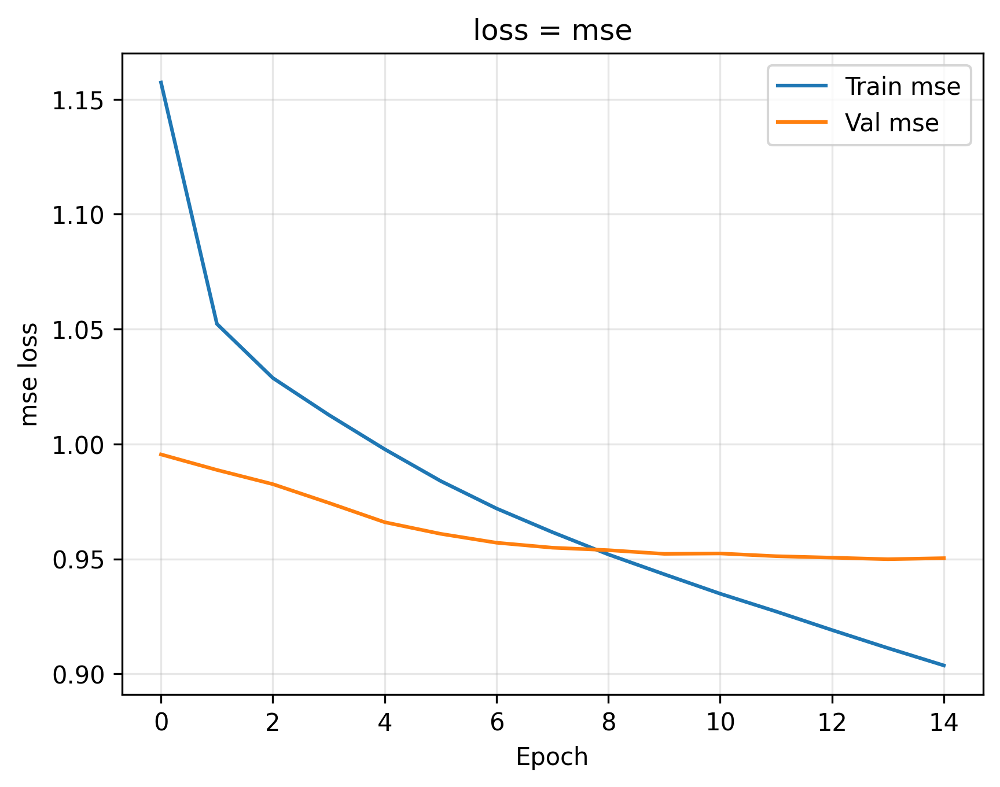

[mse] pred: (1000, 1280) | true: (1000, 1280) | test cosine similarity: 0.6412
[mse] mean L2 norm    ->  fMRI-pred: 27.59   CLIP image: 41.90
[mse] cluster radius  ->  fMRI-pred: 13.56   CLIP image: 33.93   (smaller = more collapsed)


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


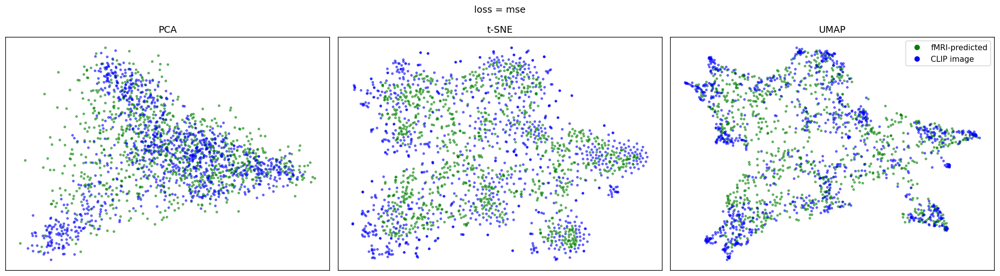

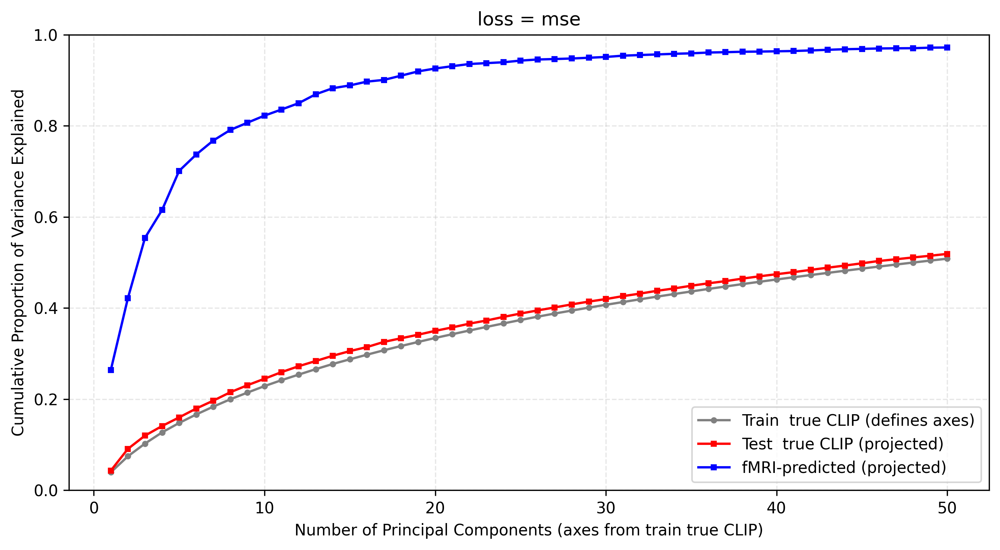

[cosine] Epoch 1/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   1 - Train: 0.9700 | Val: 0.9164


[cosine] Epoch 2/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   2 - Train: 0.8999 | Val: 0.8691


[cosine] Epoch 3/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   3 - Train: 0.8518 | Val: 0.8332


[cosine] Epoch 4/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   4 - Train: 0.8159 | Val: 0.8142


[cosine] Epoch 5/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   5 - Train: 0.7889 | Val: 0.7996


[cosine] Epoch 6/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   6 - Train: 0.7672 | Val: 0.7933


[cosine] Epoch 7/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   7 - Train: 0.7495 | Val: 0.7852


[cosine] Epoch 8/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   8 - Train: 0.7341 | Val: 0.7814


[cosine] Epoch 9/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch   9 - Train: 0.7196 | Val: 0.7769


[cosine] Epoch 10/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch  10 - Train: 0.7064 | Val: 0.7747


[cosine] Epoch 11/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch  11 - Train: 0.6943 | Val: 0.7711


[cosine] Epoch 12/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch  12 - Train: 0.6822 | Val: 0.7689


[cosine] Epoch 13/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch  13 - Train: 0.6703 | Val: 0.7674


[cosine] Epoch 14/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch  14 - Train: 0.6597 | Val: 0.7668


[cosine] Epoch 15/15:   0%|          | 0/51 [00:00<?, ?it/s]

[cosine] Epoch  15 - Train: 0.6489 | Val: 0.7687
[cosine] saved: /content/drive/MyDrive/braid2/runs/mlp_cosine_20260820_040200/model.pth


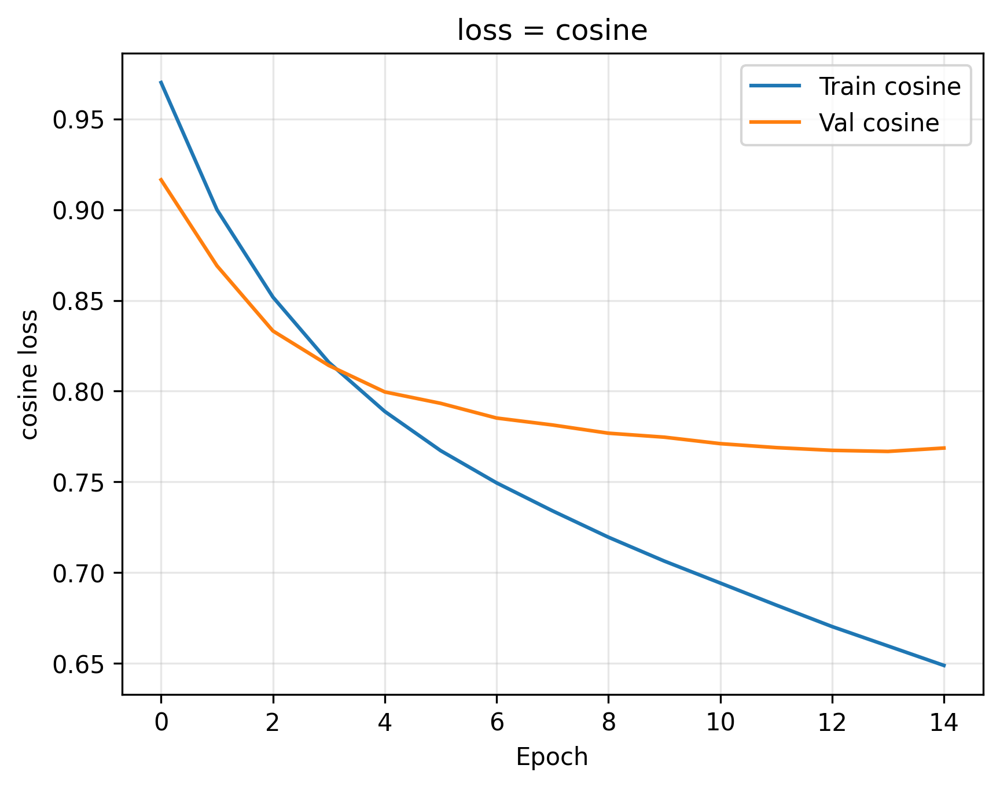

[cosine] pred: (1000, 1280) | true: (1000, 1280) | test cosine similarity: 0.4821
[cosine] mean L2 norm    ->  fMRI-pred: 68.52   CLIP image: 41.90
[cosine] cluster radius  ->  fMRI-pred: 63.56   CLIP image: 33.93   (smaller = more collapsed)


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


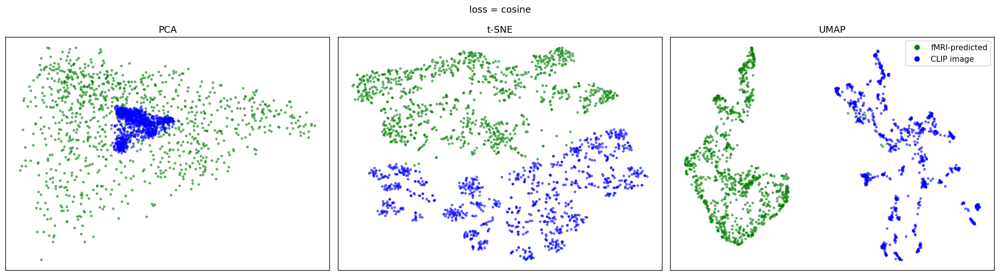

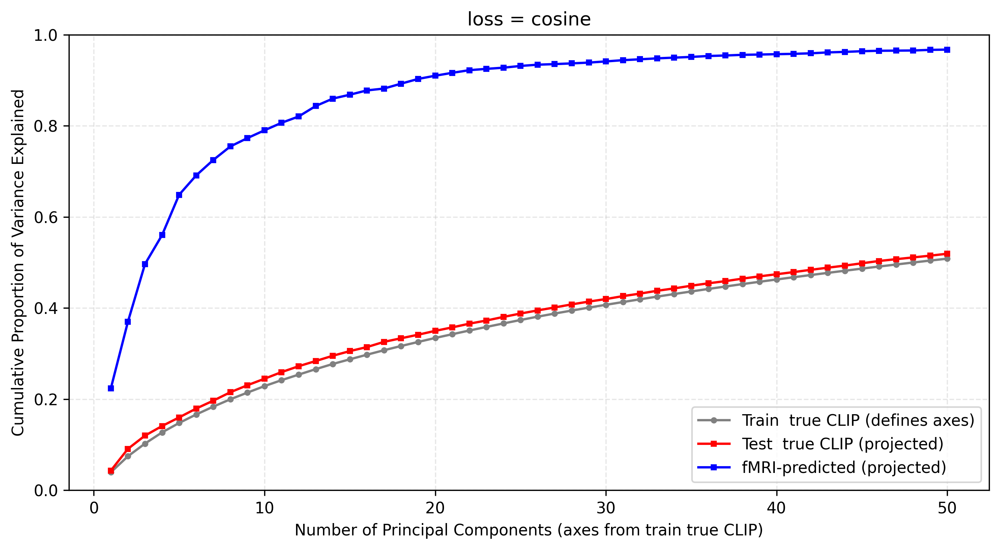


=== sweep summary ===
mse           test cosine similarity: 0.6412   run_dir: /content/drive/MyDrive/braid2/runs/mlp_mse_20260820_040200
cosine        test cosine similarity: 0.4821   run_dir: /content/drive/MyDrive/braid2/runs/mlp_cosine_20260820_040200

best loss by test cosine similarity: mse (0.6412)


In [ ]:
results = {}
for loss_type in LOSS_TYPES:
    model, run_dir = train_one(loss_type)
    cos_sim = diagnose(model, run_dir, loss_type)
    results[loss_type] = {"model": model, "run_dir": run_dir, "cos_sim": cos_sim}

print("\n=== sweep summary ===")
for lt, r in results.items():
    print(f"{lt:12s}  test cosine similarity: {r['cos_sim']:.4f}   run_dir: {r['run_dir']}")

best_loss = max(results, key=lambda k: results[k]["cos_sim"])
print(f"\nbest loss by test cosine similarity: {best_loss} ({results[best_loss]['cos_sim']:.4f})")

## Decode unseen shared-1000 trials -> images (every loss)
Reconstructs from the **repeat-averaged shared-1000 test set** (no leakage), once per loss in
`LOSS_TYPES`, using that loss's own trained model. Runs `avg fMRI -> MLP -> CLIP embed` and feeds the
de-normalized embed into the frozen Kandinsky decoder (no prior yet). Ground truth comes straight from
`nsd_stimuli.hdf5` by image id. Each panel is **reconstruction | ground truth**. The decoder/prior are
loaded once and reused across losses; only the encoder's predicted embeds differ per loss.

In [ ]:
!pip install -q diffusers accelerate
import random, h5py
from PIL import Image
from diffusers import KandinskyV22Pipeline, KandinskyV22PriorPipeline

Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [ ]:
SEED = 0                         # reproducible pick of shared-1000 test images
STIM = f"{BASE}/nsd_stimuli.hdf5"

# frozen Kandinsky decoder — conditions directly on a 1280-d CLIP image embed
decoder = KandinskyV22Pipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder", torch_dtype=torch.float16).to(DEVICE)

# proper NEGATIVE image embed (zero-image embed from the prior) — NOT literal zeros,
# which cause a magenta color-cast under classifier-free guidance
prior = KandinskyV22PriorPipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-prior", torch_dtype=torch.float16).to(DEVICE)
neg_embed = prior.get_zero_embed(1).to(DEVICE, torch.float16)      # [1, 1280]

def ground_truth(img):           # imgBrick id -> PIL 512x512
    with h5py.File(STIM, "r") as f:
        return Image.fromarray(f["imgBrick"][int(img)]).resize((512, 512))

# --- pick N unseen shared-1000 test images (seeded, shared across all losses for a fair comparison) ---
N = 12
picks = random.Random(SEED).sample(range(len(test_img_ids)), N)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/776 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

decoding with loss = mse


  0%|          | 0/50 [00:00<?, ?it/s]

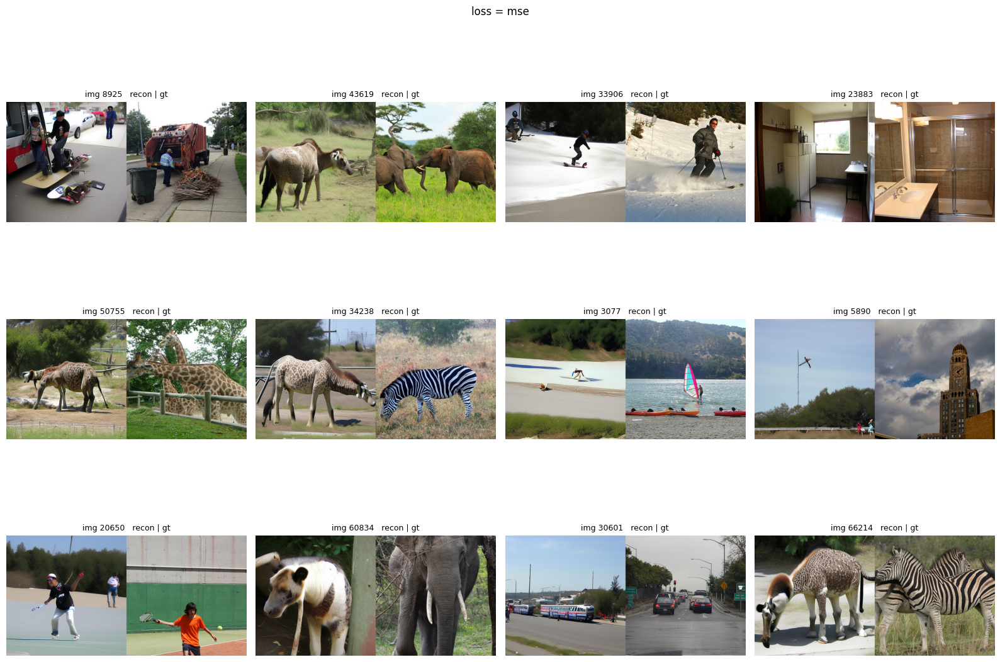

decoding with loss = cosine


  0%|          | 0/50 [00:00<?, ?it/s]

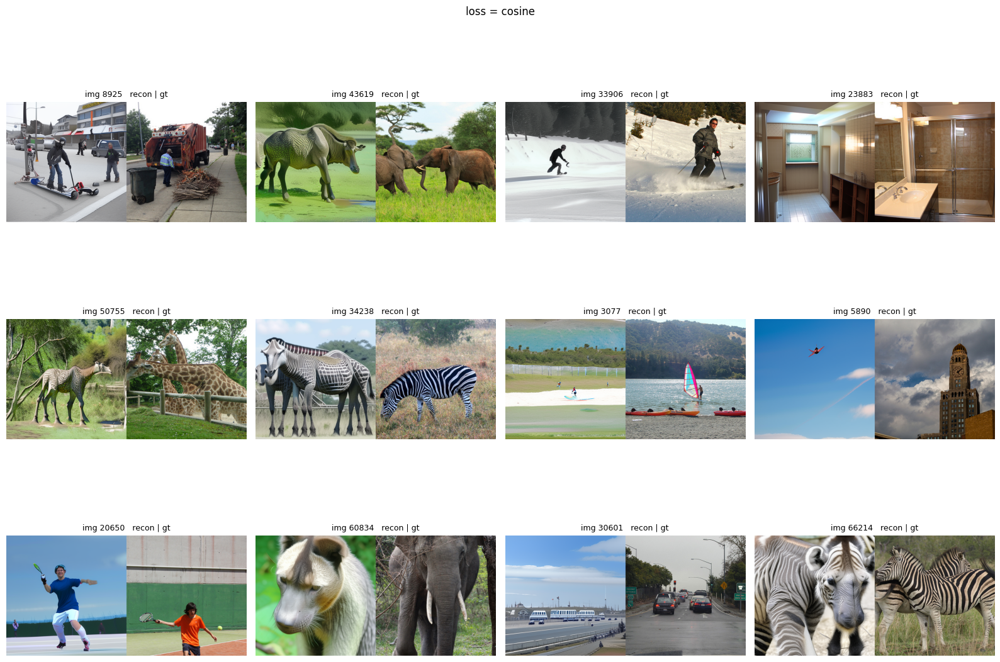

In [ ]:
def decode_grid(loss_type):
    model   = results[loss_type]["model"]
    run_dir = results[loss_type]["run_dir"]

    # --- avg fMRI -> MLP -> predicted CLIP embeds (batched) ---
    model.eval()
    with torch.no_grad():
        xb = ((test_betas[picks] - beta_mean) / beta_std).to(DEVICE)
        emb = model(xb) * clip_std.to(DEVICE) + clip_mean.to(DEVICE)
        if "cosine" in loss_type:                                      # cosine terms never constrain magnitude
            emb = emb / emb.norm(dim=1, keepdim=True) * clips[train_idx].norm(dim=1).mean()
        embeds = emb.half()

    # --- decode all N -> images ---
    recons = decoder(image_embeds=embeds,
                     negative_image_embeds=neg_embed.repeat(len(embeds), 1),
                     num_inference_steps=50, height=512, width=512).images

    # --- grid: each panel = reconstruction | ground truth ---
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for ax, i, recon in zip(axes.flat, picks, recons):
        pair = np.concatenate([np.asarray(recon), np.asarray(ground_truth(test_img_ids[i]))], axis=1)
        ax.imshow(pair); ax.set_title(f"img {test_img_ids[i]}   recon | gt", fontsize=9); ax.axis("off")
    fig.suptitle(f"loss = {loss_type}")
    plt.tight_layout()
    plt.savefig(f"{run_dir}/decode_grid.png", dpi=150, bbox_inches="tight")
    plt.show()


for loss_type in LOSS_TYPES:
    print(f"decoding with loss = {loss_type}")
    decode_grid(loss_type)

## Sanity control — decode the *ground-truth* CLIP embeds
Feeds the **real** CLIP embeds (not any model's predictions) through the same decoder, for the same
picks. Loss-independent — it never touches a trained model — so it only needs to run once for the
whole sweep, not once per loss. If these reconstruct the correct stimuli, the pipeline + data
alignment (`betas <-> clips <-> image`) is correct, and any gap in the grids above is the *encoder's*
fault, not a bug.

  0%|          | 0/50 [00:00<?, ?it/s]

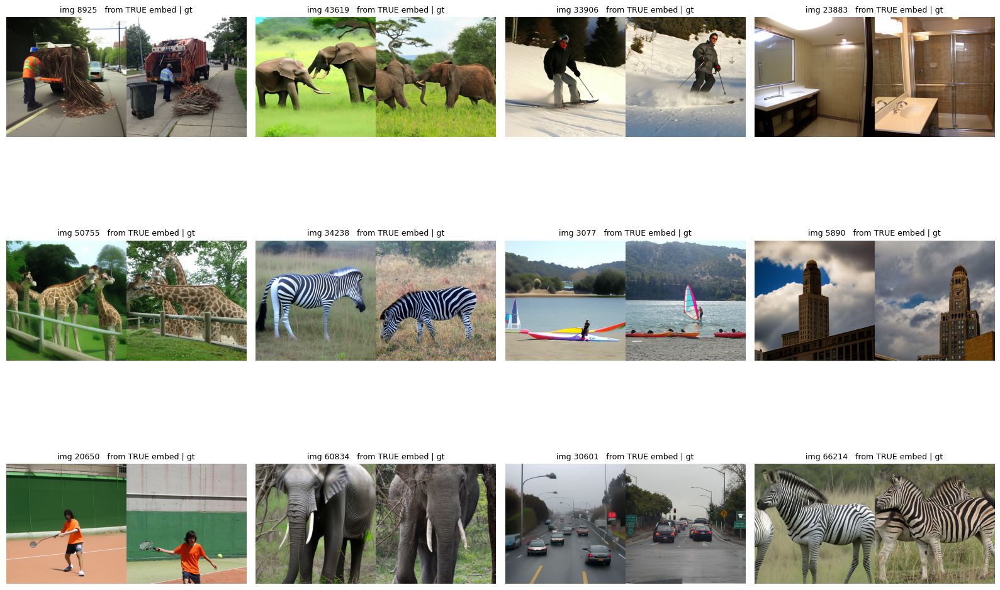

In [ ]:
# decode the REAL CLIP embeds for the same picks (upper bound / alignment check)
with torch.no_grad():
    true_emb = test_clips[picks].to(DEVICE).half()          # ground-truth embeds, no model
ctrl = decoder(image_embeds=true_emb,
               negative_image_embeds=neg_embed.repeat(len(true_emb), 1),
               num_inference_steps=50, height=512, width=512).images

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for ax, i, img in zip(axes.flat, picks, ctrl):
    pair = np.concatenate([np.asarray(img), np.asarray(ground_truth(test_img_ids[i]))], axis=1)
    ax.imshow(pair); ax.set_title(f"img {test_img_ids[i]}   from TRUE embed | gt", fontsize=9); ax.axis("off")
plt.tight_layout()
plt.savefig(f"{RUNS_DIR}/sanity_control_{SWEEP_TAG}.png", dpi=150, bbox_inches="tight")
plt.show()